
# SDA Project: Analysing Terrorist Attacks.

By: Hendrik Huang, Martijn Messanella, Julius Wagt

In [1]:
# Decide whether you want to save figures.
savefigs = True 

Here import the libraries. Check the README to see any installations that are required in order to run the notebook completely. We had installed the Basemap package in our root virtual environment. But apparently the Basemap package relies on the proj.4 env variable to be set. Which does not work if you are working in a root environment. So we implemented a dirty fix to set the missing variable. If the fix does not work when reviewing the code, all the Basemap figures are included in the /figures map.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import math
import os
import conda

from scipy import stats
from mpl_toolkits import mplot3d
from sklearn.cluster import DBSCAN
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Hack to fix missing PROJ4 env var.
conda_file_dir = conda.__file__
conda_dir = conda_file_dir.split('lib')[0]
proj_lib = os.path.join(os.path.join(conda_dir, 'share'), 'proj')
os.environ["PROJ_LIB"] = proj_lib

# Import after setting variable.
from mpl_toolkits.basemap import Basemap

In [3]:
# https://stackoverflow.com/questions/18171739/unicodedecodeerror-when-reading-csv-file-in-pandas-with-python
# utf-8 encoding error. Set low_memory = False because the compiler was confused over multiple object types.
df = pd.read_csv('data/globalterrorismdb_0718dist.csv', encoding = "'ISO-8859-1'", low_memory=False)

# Happiness rate per year data.
df_2015 = pd.read_csv('data/2015.csv')
df_2016 = pd.read_csv('data/2016.csv')
df_2017 = pd.read_csv('data/2017.csv')

# Fixing column names of the happiness dataset.
df_2015.columns = df_2015.columns.str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
df_2016.columns = df_2016.columns.str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
df_2017.columns = df_2017.columns.str.lower().str.replace(' ', '_').str.replace('.', '_')

In [4]:
# Some countries exist in one dataset but not in the other. We filter on countries that exist
# in all three datasets.
def filter_happiness():
    # Take all countries from the three datasets.
    c2015 = list(df_2015.country.values)
    c2016 = list(df_2016.country.values)
    c2017 = list(df_2017.country.values)
        
    # Create a set of all countries.
    ct = set(c2015 + c2016 + c2017)

    # Check if a country is in all datasets. 
    all_c = [c for c in ct if c in c2015 and c in c2016 and c in c2017]
    
    # Now filter the countries that are not in all three datasets.
    not_2015 = [c for c in c2015 if c not in all_c]
    not_2016 = [c for c in c2016 if c not in all_c]
    not_2017 = [c for c in c2017 if c not in all_c]

    # Drop the rows from the dataframes that are not needed.
    for name in not_2015:
        idx = df_2015.loc[df_2015['country'] == name].index[0]
        df_2015.drop([idx], inplace=True)

    for name in not_2016:
        idx = df_2016.loc[df_2016['country'] == name].index[0]
        df_2016.drop([idx], inplace=True)
        
    for name in not_2017:
        idx = df_2017.loc[df_2017['country'] == name].index[0]
        df_2017.drop([idx], inplace=True)


# Check if the length is the same otherwise we get errors for keys that do not exist anymore.
if len(df_2015) != len(df_2016) != len(df_2017):    
    filter_happiness()
    
# Take all countries we have data on.
countries = df_2015.country.values

# Happiness score for the countries.
happiness_2015 = df_2015.happiness_score.values
happiness_2016 = df_2016.happiness_score.values
happiness_2017 = df_2017.happiness_score.values

# Trust in government data.
trust_gov_2015 = df_2015.trust_government_corruption.values
trust_gov_2016 = df_2016.trust_government_corruption.values
trust_gov_2017 = df_2017.trust__government_corruption_.values

# GDP (Gross Domestic Product) per capita.
gdp_2015 = df_2015.economy_gdp_per_capita.values
gdp_2016 = df_2016.economy_gdp_per_capita.values
gdp_2017 = df_2017.economy__gdp_per_capita_.values

# Terrorist data for 2015, 2016 and 2017.
terror_2015 = df.loc[df['iyear'] == 2015]
terror_2016 = df.loc[df['iyear'] == 2016]
terror_2017 = df.loc[df['iyear'] == 2017]

In [5]:
# Fixing terrorism data.
years = list(df.iyear.values)
years_set = list(set(df.iyear.values))

# Exclude first day/month (the zero value) since it does not make sense.
months = list(df.imonth.values)
months_set = list(set(df.imonth.values))[1:]

days = list(df.iday.values)
days_set = list(set(df.iday.values))[1:]

# Find the amount of attacks for each year.
y1 = [years.count(i) for i in years_set]
y2 = [months.count(i) for i in months_set]
y3 = [days.count(i) for i in days_set]

# Unique countries, regions and cities.
terror_countries = list(set(df.country_txt.values))
terror_regions = list(set(df.region_txt.values))
terror_cities = list(set(df.city.values))

### Terrorist attacks over the years

Here we plot the number of attacks for a given day, month or year to see if we can see a pattern from these plots.

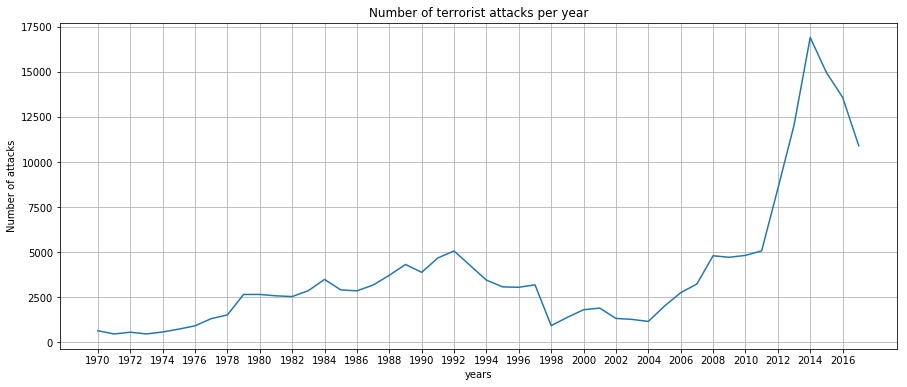

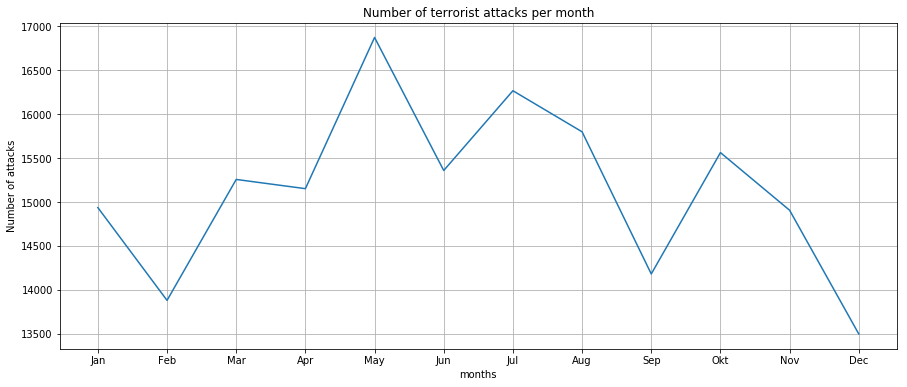

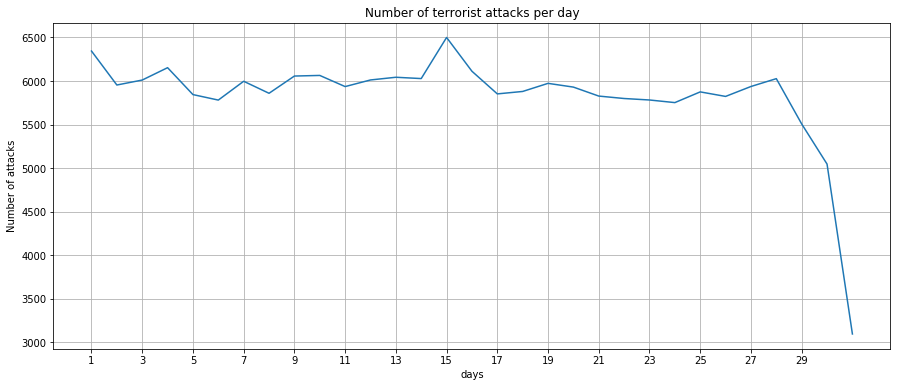

In [6]:
# Plot number of terrorist attacks for a certain time period
def plot_count(period, y, ticks, title, tick_labels=None):    
    fig = plt.figure(figsize=(15, 6))
    ax = fig.subplots()
    
    ax.plot(period, y)
    ax.set_xticks(ticks)
    if tick_labels: ax.set_xticklabels(tick_labels)
    plt.xlabel(title + 's')
    plt.ylabel('Number of attacks')
    plt.title('Number of terrorist attacks per ' + title)
    plt.grid(True)
    if savefigs: plt.savefig('figures/Number of terrorist attacks per ' + title + '.png')
    plt.show()
    
    
month_ticks = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Okt', 'Nov', 'Dec']
    
plot_count(years_set, y1, np.arange(min(years_set), max(years_set), 2), 'year')
plot_count(months_set, y2, np.arange(1, 13), 'month', month_ticks)
plot_count(days_set, y3, np.arange(min(days_set), max(days_set), 2), 'day')

Two plots of the longitude and latitude over the years, to see if anything has changed. The change will become more apparent later.

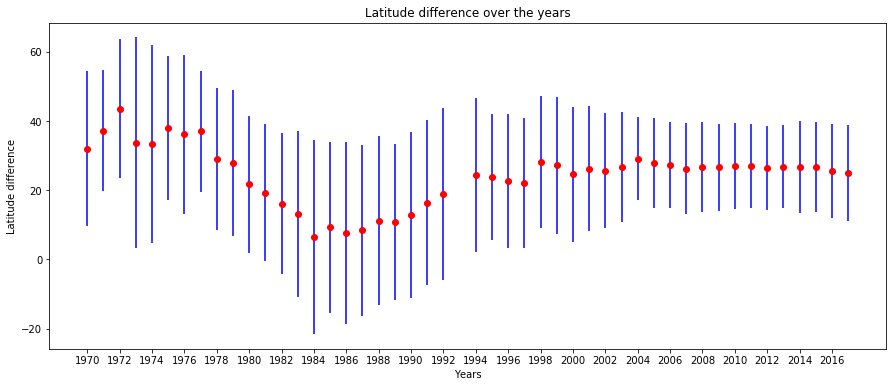

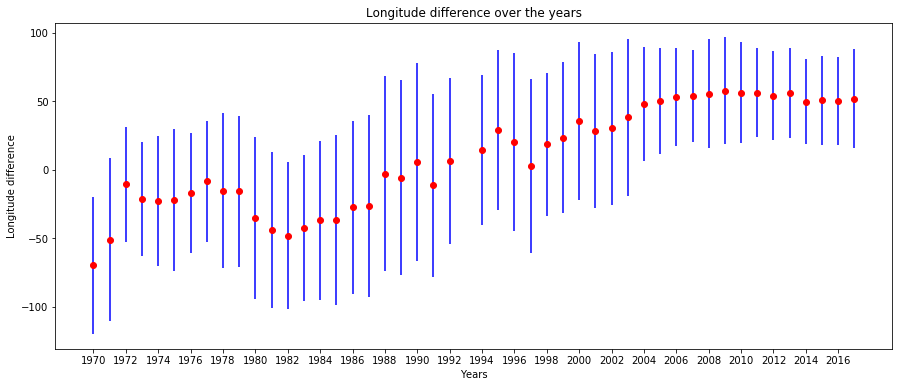

In [7]:
# Create a latitude/longitude plot.
def plot_latitude_longitude(lst, title, tick):
    plt.figure(figsize=(15, 6))

    for n in lst:
        year = n[0]
        var = n[1]
        mean_var = np.mean(var)

        yerr = np.std(var)

        plt.errorbar(year, mean_var, yerr=yerr, fmt='o', color='r', ecolor='b')

    plt.xticks(tick)
    plt.xlabel('Years')
    plt.ylabel(title + ' difference')
    plt.title(title + ' difference over the years')
    if savefigs: plt.savefig('figures/' + title + ' difference over the years.png')
    plt.show()


# Clean the latitude and longitude values and prepare plot values.
def clean_latitude_longitude(df, years_set, plot=False):
    longitude = []
    latitude = []
    
    # For plot purposes.
    plot_lat = []
    plot_lon = []
    
    for year in years_set:
        d = df.loc[df['iyear'] == year]

        # anders
        lat = list(d.latitude.values)
        lon = list(d.longitude.values)
        
        clean_lat = []
        clean_lon = []
        
        for i in range(len(lat)):
            if not math.isnan(lat[i]) and not math.isnan(lon[i]) and \
            lat[i] < 180 and lat[i] > -180 and lon[i] < 180 and lon[i] > -180:
                clean_lon.append(lon[i])
                clean_lat.append(lat[i])
                
        plot_lat.append((year, clean_lat))
        plot_lon.append((year, clean_lon))
        longitude.append(clean_lon)
        latitude.append(clean_lat)
        
    if plot == True:
        # Plot the longitude and latitude over the years.
        tick = np.arange(min(years_set), max(years_set), 2.0)
        plot_latitude_longitude(plot_lat, 'Latitude', tick)
        plot_latitude_longitude(plot_lon, 'Longitude', tick)
    
    return longitude, latitude, plot_lon, plot_lat

    
longitude, latitude, lon_years, lat_years = clean_latitude_longitude(df, years_set, plot=True)

# Flatten out list, check first if we have a nested list to flatten.
if any(isinstance(i, list) for i in latitude) and any(isinstance(i, list) for i in longitude):
    latitude = [item for sublst in latitude for item in sublst]
    longitude = [item for sublst in longitude for item in sublst]

### Visualizing attacks

Here we will start visualizing the attacks using the Basemap library.

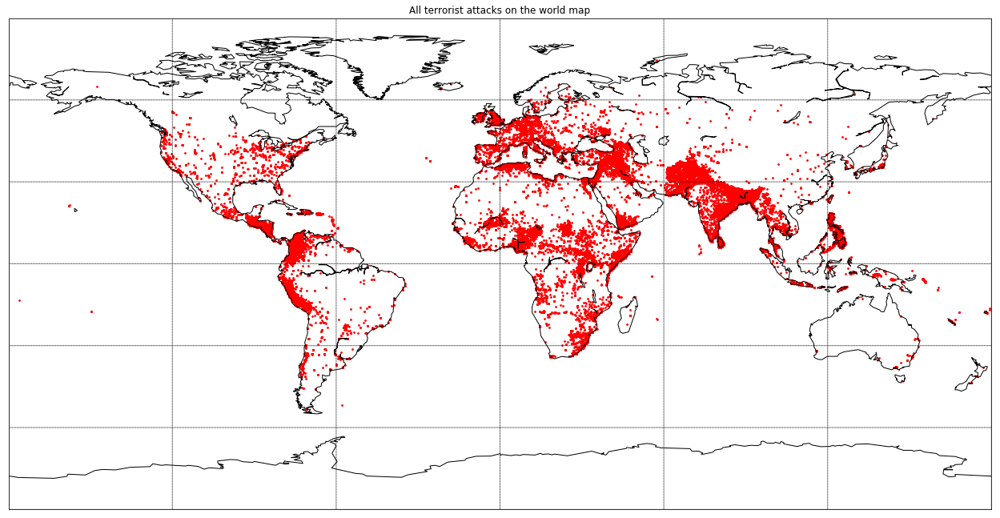

In [8]:
# llcrnrlat, llcrnrlon, urcrnrlat, urcrnrlon are the lat/lon 
# values of the lower left and upper right corners of the map.
# resolution = 'c' means use crude resolution coastlines.
def plot_map(longitude, latitude):
    plt.figure(figsize=(22, 12))

    # Equidistant Cylindrical Projection, just displays the world in latitude/longitude coordinates.
    m = Basemap(projection='cyl', llcrnrlat=-90, urcrnrlat=90,\
                llcrnrlon=-180, urcrnrlon=180, resolution='c')

    m.drawcoastlines()

    # Draw all the attacks as red dots.
    x, y = m(longitude, latitude)
    plt.scatter(x, y, 3, marker='o', color='r') 

    # Draw parallels and meridians.
    m.drawparallels(np.arange(-90., 91., 30.))
    m.drawmeridians(np.arange(-180., 181., 60.))
    plt.title("All terrorist attacks on the world map")
    if savefigs: plt.savefig('figures/All terrorist attacks on the world map.png')
    plt.show()

    
plot_map(longitude, latitude)

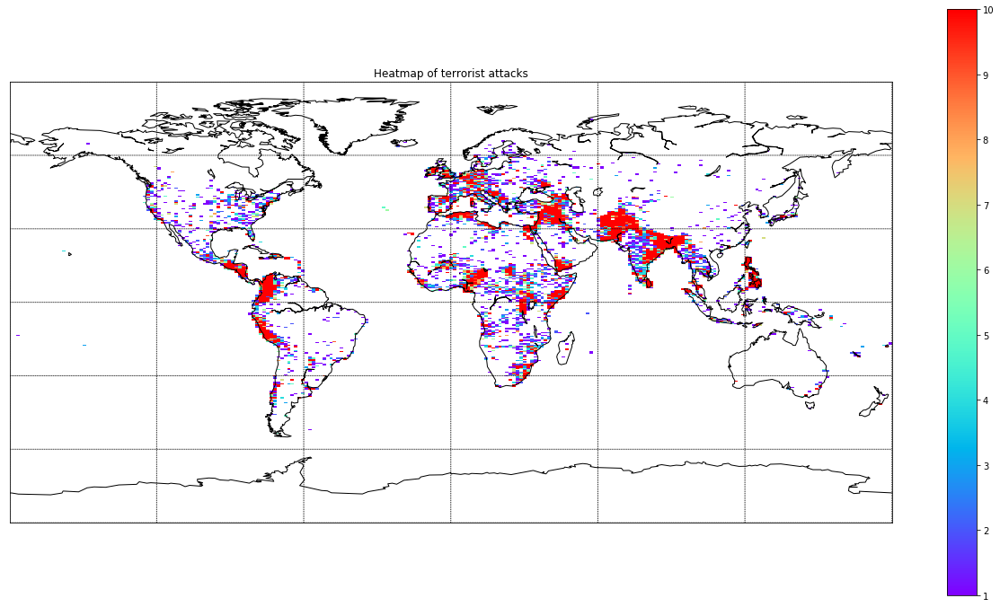

In [9]:
# Compute the bi-dimensional histogram of two data samples.
# Projected onto the world map.
def plot_density_map(longitude, latitude, title, londb=250, latdb=250, vmax=10):
    # Draw the map again.
    plt.figure(figsize=(22, 12))
    m = Basemap(projection='cyl', llcrnrlat=-90, urcrnrlat=90,\
                llcrnrlon=-180, urcrnrlon=180, resolution='c')

    m.drawcoastlines()

    # Draw parallels and meridians.
    m.drawparallels(np.arange(-90., 91., 30.))
    m.drawmeridians(np.arange(-180., 181., 60.))
    plt.title(title)

    # Compute appropriate bins to chop up the data.
    lon_bins = np.linspace(min(longitude)-1, max(longitude)+1, londb) 
    lat_bins = np.linspace(min(latitude)-1, max(latitude)+1, latdb)

    density, _, _ = np.histogram2d(latitude, longitude, [lat_bins, lon_bins])

    # Turn the lon/lat of the bins into 2 dimensional arrays ready
    # for conversion into projected coordinates.
    lon_bins_2d, lat_bins_2d = np.meshgrid(lon_bins, lat_bins)

    # Delete all bad data, mainly where there are no attacks.
    density = np.ma.masked_where(density < 1, density)

    # Set an appropriate colormap.
    cmap = plt.cm.rainbow
    cmap.set_bad(color='white')

    # Convert the bin mesh to map coordinates:
    xs, ys = m(lon_bins_2d, lat_bins_2d) 

    # Manipulate the amount of attacks in an area to determine the density.
    plt.pcolormesh(xs, ys, density, cmap=cmap, vmax=vmax)
    plt.colorbar()
    if savefigs: plt.savefig('figures/' + title + '.png')
    plt.show()

    
plot_density_map(longitude, latitude, 'Heatmap of terrorist attacks')

In [10]:
# Create a new longitude and latitude list based on the amount 
# of deaths involved in an attack.
def clean_nkill(df):
    nkills = df.nkill.values
    lat = df.latitude.values
    lon = df.longitude.values
    
    lon_nkill = []
    lat_nkill = []
    
    for i in range(len(nkills)):
        if not math.isnan(lat[i]) and not math.isnan(lon[i]) and \
        lat[i] < 180 and lat[i] > -180 and lon[i] < 180 and lon[i] > -180:
            if not math.isnan(nkills[i]) and nkills[i] > 0:
                lon_nkill.append([lon[i]] * int(nkills[i]))
                lat_nkill.append([lat[i]] * int(nkills[i]))
    
    return lon_nkill, lat_nkill

lon_nkill, lat_nkill = clean_nkill(df)

# Flatten out list, check first if we have a nested list to flatten.
if any(isinstance(i, list) for i in lat_nkill) and any(isinstance(i, list) for i in lon_nkill):
    lat_nkill = [item for sublst in lat_nkill for item in sublst]
    lon_nkill = [item for sublst in lon_nkill for item in sublst]

#### Density based on kills per attack

We filtered the attacks where there were no casualties. We then made the density of attacks dependent of the amount of kills per attack. We can see that the already red spots on the map have become more red, making these places a hotspot for terrorist attacks. Places like Europe now have a lower density compared to the plot above. Meaning a lot of attacks get classified as terrorist attacks while there are relatively low death numbers.

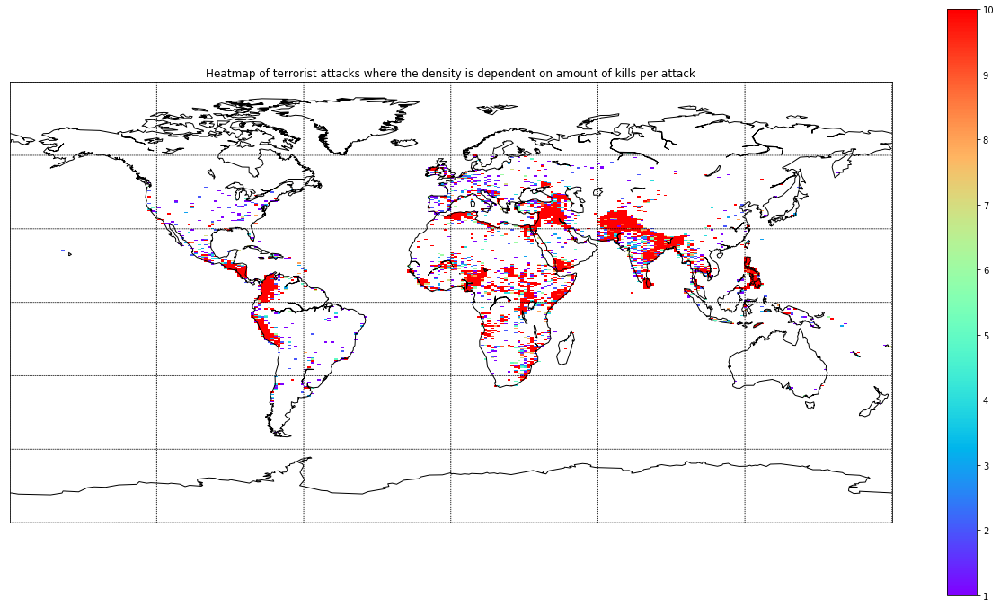

In [11]:
txt = 'Heatmap of terrorist attacks where the density is dependent on amount of kills per attack'
plot_density_map(lon_nkill, lat_nkill, txt)

In [12]:
# The gif is essentially a collection of subplots.
fig, ax = plt.subplots()

# Set the sizes of the gif.
fig.set_figheight(10)
fig.set_figwidth(15)

# Use the same basemap.
m = Basemap(projection='cyl', llcrnrlat=-90, urcrnrlat=90,\
            llcrnrlon=-180, urcrnrlon=180, resolution='c')

m.drawcoastlines()

# Give a starting point for the animation to start with.
x, y = m(0, 0)
point = m.plot(x, y, 'ro', markersize=3)[0]

# Draw parallels and meridians.
m.drawparallels(np.arange(-90., 91., 30.))
m.drawmeridians(np.arange(-180., 181., 60.))
plt.title("Terrorist attacks per year")

# Animation function. This is called sequentially.
def animate(i):
    # Get the longitudes and latitudes per year.
    lons, lats = lon_years[i][1], lat_years[i][1]
    x, y = m(lons, lats)
    point.set_data(x, y)
    ax.set_xlabel('timestep {0}'.format(i+1970))
    return point,

# Call the animator. blit=True means only re-draw the parts that have changed.
anim = FuncAnimation(fig, animate, frames=len(years_set), interval=100, blit=True)

# Close the animation.
plt.close()

# Use for easy control.
HTML(anim.to_jshtml())

# Use to save video.
# HTML(anim.to_html5_video())

### Correlation

Here we will try to find any correlation between our terrorist data and the happiness dataset. This is to see whether the chance of a terrorist attack is influenced by the GDP, trust in government or happiness score of a country.

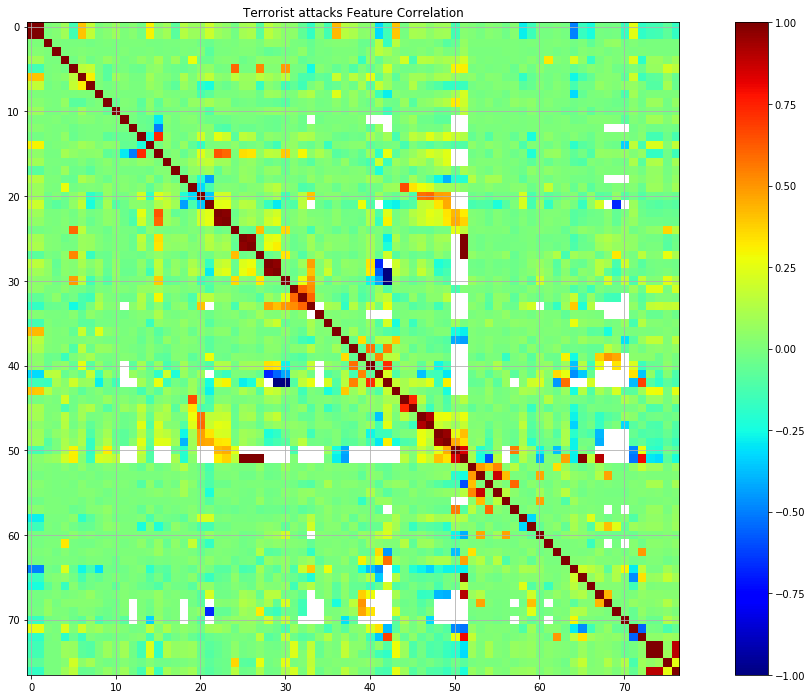

In [13]:
# Plot the correlation matrix of a single pandas dataframe.
def correlation_matrix(df):    
    plt.figure(figsize=(20,12))
    
    cax = plt.imshow(df.corr(), interpolation="nearest", cmap='jet')
    plt.grid(True)
    plt.title('Terrorist attacks Feature Correlation')

    plt.colorbar(cax)
    if savefigs: plt.savefig('figures/Terrorist attacks Feature Correlation.png')
    plt.show()

    
# Correlation for the terrorist dataset, to see if any feature of an attack has influence
# on another. Both the axis are just filled with features, too many to label.
correlation_matrix(df)

In [14]:
# Find a correlation between two pandas dataframes.
def features(df, attacks, happy_features, countries):
    count = attacks['country_txt'].value_counts()
    attack = list(zip(count.index, count.values))

    # Fill in zero for countries that were left out in the count.values
    for country in countries:
        atk = [a[0] for a in attack]
        if country not in atk:
            attack.append((country, 0))

    happy = list(zip(countries, happy_features))
    
    # Sorts in place.
    attack.sort(key=lambda tup: tup[0]) 
    happy.sort(key=lambda tup: tup[0]) 

    val1 = [a[1] for a in attack]
    val2 = [a[1] for a in happy]
    
    # Create a list of features per attack.
    lst = list(zip(val1, val2))
    
    # Sort on highest score.
    lst = sorted(zip(val1, val2), reverse=True)[15:]
    lst.sort(key=lambda tup: tup[1], reverse=True)

    v1 = [a[1] for a in lst]
    v2 = [a[0] for a in lst]
        
    return v1, v2


# Amount of attacks per happiness score.
hap1, atk1 = features(df, terror_2015, happiness_2015, countries)
hap2, atk2 = features(df, terror_2016, happiness_2016, countries)
hap3, atk3 = features(df, terror_2017, happiness_2017, countries)

# Trust in government.
gov1, atk4 = features(df, terror_2015, trust_gov_2015, countries)
gov2, atk5 = features(df, terror_2016, trust_gov_2016, countries)
gov3, atk6 = features(df, terror_2017, trust_gov_2017, countries)

# GDP.
gdp1, atk7 = features(df, terror_2015, gdp_2015, countries)
gdp2, atk8 = features(df, terror_2016, gdp_2016, countries)
gdp3, atk9 = features(df, terror_2017, gdp_2017, countries)

We can already see from the plots that GDP and happiness score do not really effect the amount of terrorist attacks per country, since it is pretty evenly spread. We do notice that in countries that have a low trust in government more attacks take place.

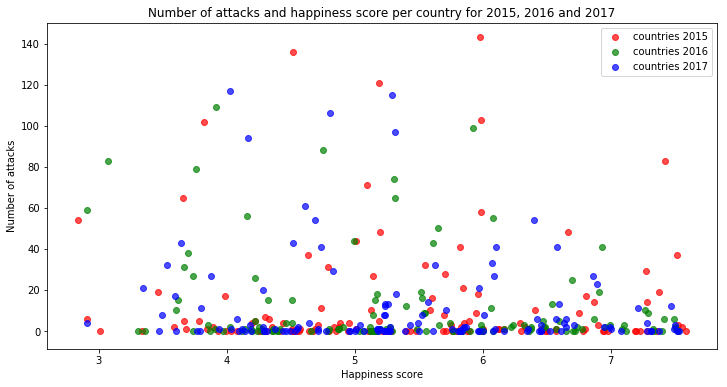

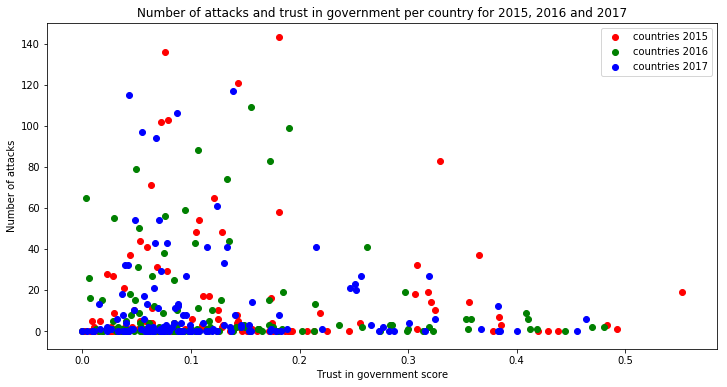

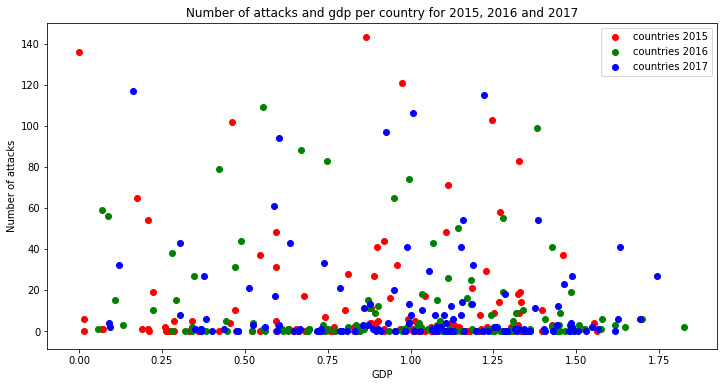

In [15]:
# Plot the correlation for the three years. For the happiness score.
plt.figure(figsize=(12,6))
plt.scatter(hap1, atk1, color='r', label='countries 2015', alpha=0.7)
plt.scatter(hap2, atk2, color='g', label='countries 2016', alpha=0.7)
plt.scatter(hap3, atk3, color='b', label='countries 2017', alpha=0.7)

plt.xlabel('Happiness score')
plt.ylabel('Number of attacks')
title1 = 'Number of attacks and happiness score per country for 2015, 2016 and 2017'
plt.title(title1)
plt.legend()
if savefigs: plt.savefig('figures/' + title1 + '.png')
plt.show()

# Plot the correlation for the three years. For the trust in government.
plt.figure(figsize=(12,6))
plt.scatter(gov1, atk4, color='r', label='countries 2015')
plt.scatter(gov2, atk5, color='g', label='countries 2016')
plt.scatter(gov3, atk6, color='b', label='countries 2017')

plt.xlabel('Trust in government score')
plt.ylabel('Number of attacks')
title2 = 'Number of attacks and trust in government per country for 2015, 2016 and 2017'
plt.title(title2)
plt.legend()
if savefigs: plt.savefig('figures/' + title2 + '.png')
plt.show()

# Plot the correlation for the three years. For the gdp.
plt.figure(figsize=(12,6))
plt.scatter(gdp1, atk7, color='r', label='countries 2015')
plt.scatter(gdp2, atk8, color='g', label='countries 2016')
plt.scatter(gdp3, atk9, color='b', label='countries 2017')
plt.xlabel('GDP')
plt.ylabel('Number of attacks')
title3 = 'Number of attacks and gdp per country for 2015, 2016 and 2017'
plt.title(title3)
plt.legend()
if savefigs: plt.savefig('figures/' + title3 + '.png')
plt.show()

The data is correlated with the data shown above. Meaning the attacks are sorted according the feature (happiness score, trust in government or GDP). This attack data is then correlated with the other features over all years. From the matrix below we are sure there is an unlikely correlation between these features and the terrorist attacks. The p-values are not entirely reliable but are probably reasonable for datasets larger than 500 or so. Our data is not 500 or larger.

In [16]:
def prep(attacks, countries):
    count = attacks['country_txt'].value_counts()
    attack = list(zip(count.index, count.values))

    # Fill in zero for countries that were left out in the count.values
    for country in countries:
        atk = [a[0] for a in attack]
        if country not in atk:
            attack.append((country, 0))
                        
    return [a[1] for a in attack]


atk_2015 = prep(terror_2015, countries)[:146]
atk_2016 = prep(terror_2016, countries)[:146]
atk_2017 = prep(terror_2017, countries)[:146]

attacks = [atk_2015, atk_2016, atk_2017]
var = [happiness_2015, happiness_2016, happiness_2017, 
      trust_gov_2015, trust_gov_2016, trust_gov_2017,
      gdp_2015, gdp_2016, gdp_2017]

mat = [[stats.pearsonr(i, j)[0] for i in var] for j in attacks]

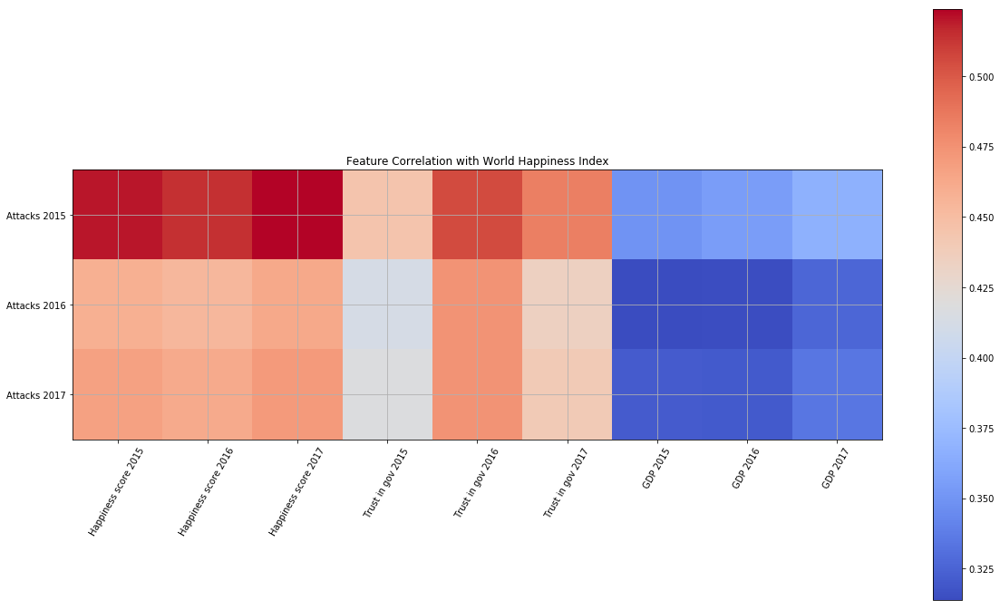

In [17]:
ylabels = ['Attacks 2015', 'Attacks 2016', 'Attacks 2017']

xlabels = ['Happiness score 2015', 'Happiness score 2016', 'Happiness score 2017', \
           'Trust in gov 2015', 'Trust in gov 2016', 'Trust in gov 2017', \
           'GDP 2015', 'GDP 2016', 'GDP 2017']

plt.figure(figsize=(20,12))
    
cax = plt.imshow(mat, interpolation="nearest", cmap='coolwarm')
plt.grid(True)
plt.title('Feature Correlation with World Happiness Index')
plt.xticks(np.arange(9), xlabels, rotation=60)
plt.yticks(np.arange(3), ylabels)

plt.colorbar(cax)
if savefigs: plt.savefig('figures/Feature Correlation with World Happiness Index.png')
plt.show()

In [18]:
# Calculate the great circle distance between two points on earth.
def haversine(lon1, lat1, lon2, lat2):
    # Convert decimal degrees to radians.
    lon1, lat1, lon2, lat2 = np.radians([lon1, lat1, lon2, lat2])

    # The Haversine formula.
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    
    # Radius of earth in kilometers. 
    r = 6371 
    return c * r

In [19]:
# Return logical and of boolean indexing arrays
def dfview(*args):
    mask = args[0]
    for arg in args[1:]:
        mask = np.logical_and(mask, arg)
    return mask

### Fast Fourier Transform

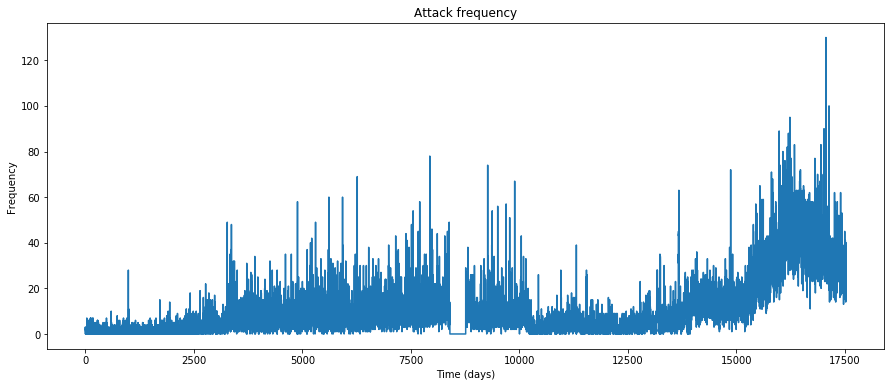

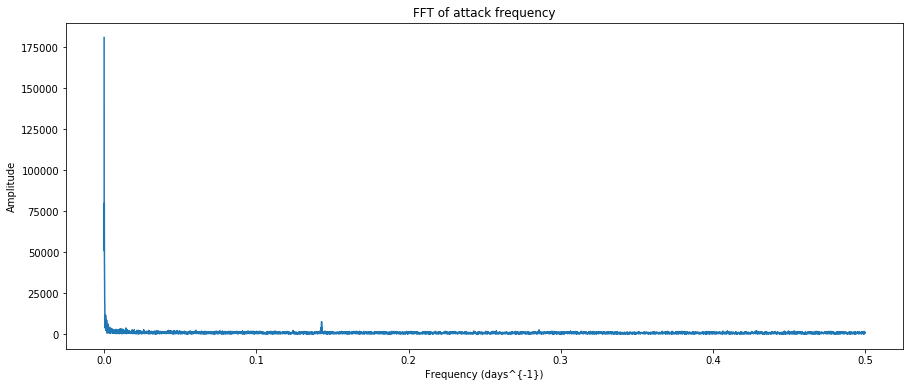

In [20]:
# Mask valid times.
vtimes = dfview(df['imonth'] != 0, df['iday'] != 0)
datetimes = pd.to_datetime({'year': df[vtimes]['iyear'], 'month': df[vtimes]['imonth'], 'day': df[vtimes]['iday']})

# Calculate t as days since 1970-1-1
t = (datetimes - pd.datetime(1970, 1, 1)).dt.days

freq = np.bincount(t)
n = freq.size

# Calculate the FFT.
fft = np.fft.fft(freq)
fftfreq = np.fft.fftfreq(n)

plt.figure(figsize=(15, 6))
plt.plot(freq)
plt.title('Attack frequency')
plt.xlabel('Time (days)')
plt.ylabel('Frequency')
if savefigs: plt.savefig('figures/Attack frequency')
plt.show()

plt.figure(figsize=(15, 6))
plt.plot(fftfreq[:n // 2], np.abs(fft[:n // 2]))
plt.title('FFT of attack frequency')
plt.xlabel('Frequency (days^{-1})')
plt.ylabel('Amplitude')
if savefigs: plt.savefig('figures/FFT of attack frequency')
plt.show()

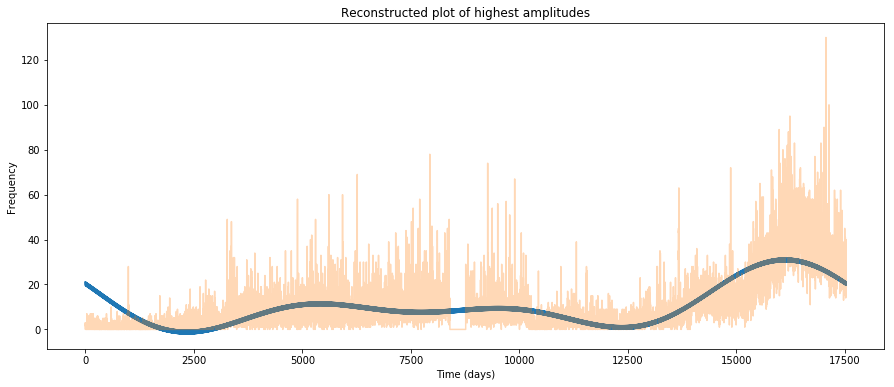

In [21]:
# Get indices of top 9 (center + 4) frequencies.
maxind = fft.argsort()[:-2 * 5:-1]

# Isolate top frequencies.
topfreq = np.zeros_like(fft)
topfreq[maxind] = fft[maxind]

# Plot the inverse Fast Fourier Transform of top frequencies.
plt.figure(figsize=(15, 6))
ifft = np.fft.ifft(topfreq)
plt.plot(ifft.real)
plt.plot(freq, alpha=0.3)
plt.title('Reconstructed plot of highest amplitudes')
plt.xlabel('Time (days)')
plt.ylabel('Frequency')
if savefigs: plt.savefig('figures/Top 9 frequencies of inverse FFT')
plt.show()

In the plot we see a lot of high noise we therefore do not know how exact this approach is.

In [22]:
T = np.max(t) / maxind[-2]

print("The peak from the FFT suggests the following interval between attacks:", T, "(in days)")

The peak from the FFT suggests the following interval between attacks: 6.998403193612774 (in days)


### Hypothesis tests

#### Distribution of times

$H_0$: distribution of random distances between t in data are the same as distances from uniform data, distribution data is uniform.

$H_1$: not $H_0$

$\alpha = 0.05$

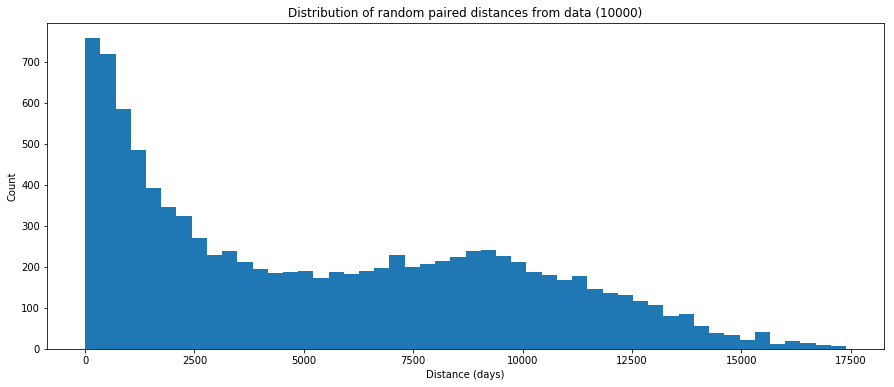

In [23]:
# Calculate the intervals in our data.
intervals = np.abs(np.random.choice(t, 10000, replace=False) - np.random.choice(t, 10000, replace=False))
std = np.std(intervals)

plt.figure(figsize=(15, 6))
plt.hist(intervals, 50)
plt.title('Distribution of random paired distances from data (10000)')
plt.xlabel('Distance (days)')
plt.ylabel('Count')
if savefigs: plt.savefig('figures/Data distance distribution')
plt.show()

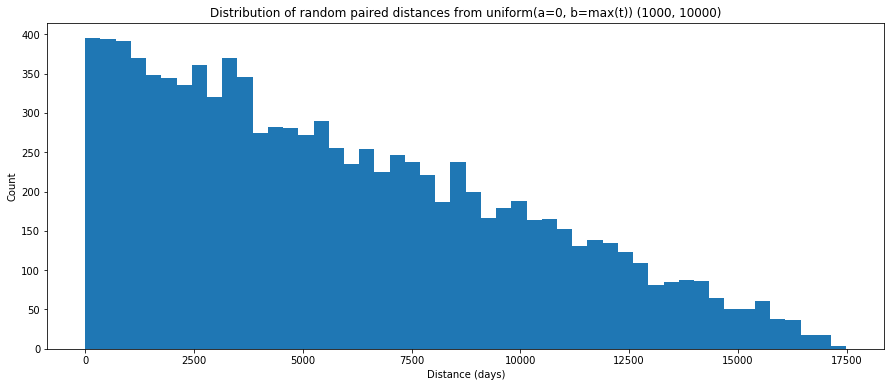

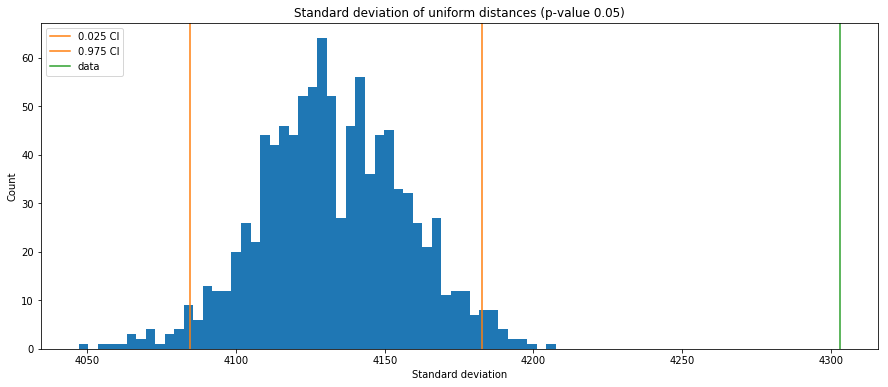

In [24]:
# Calculate the intervals in a uniform distribution of our data.
intervals = np.abs(np.random.uniform(0, np.max(t), (1000, 10000)) - np.random.uniform(0, np.max(t), (1000, 10000)))
stds = np.std(intervals, axis=1)

plt.figure(figsize=(15, 6))
plt.hist(intervals[0], 50)
plt.title('Distribution of random paired distances from uniform(a=0, b=max(t)) (1000, 10000)')
plt.xlabel('Distance (days)')
plt.ylabel('Count')
if savefigs: plt.savefig('figures/Uniform distance distribution')
plt.show()

plt.figure(figsize=(15, 6))
plt.hist(stds, 50)
plt.title('Standard deviation of uniform distances (p-value 0.05)')
plt.xlabel('Standard deviation')
plt.ylabel('Count')
plt.axvline(np.percentile(stds, 2.5), c='C1', label='0.025 CI')
plt.axvline(np.percentile(stds, 97.5), c='C1', label='0.975 CI')
plt.axvline(std, c='C2', label='data')
plt.legend()
if savefigs: plt.savefig('figures/0.05 CI of std of distances.png')
plt.show()

$H_0$ is rejected with a 0.05 confidence.

#### Distribution of weekdays

$H_0$: distribution of weekdays is uniform.

$H_1$: not $H_0$

$\alpha = 0.05$

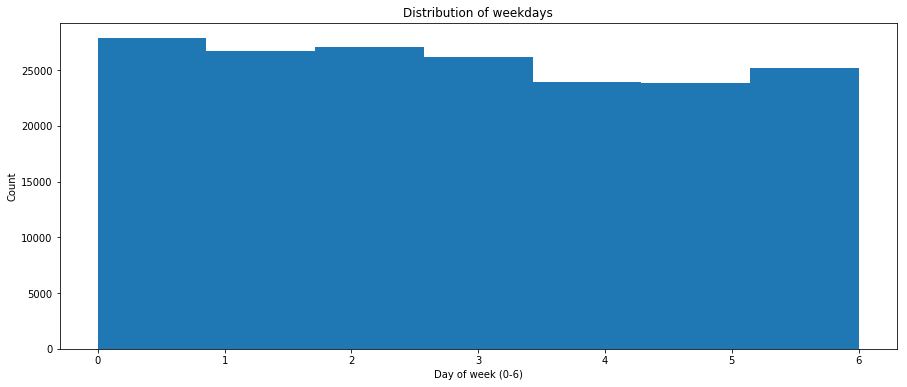

In [25]:
weekdays = datetimes.dt.weekday
std = np.std(weekdays)

plt.figure(figsize=(15, 6))
plt.hist(weekdays, 7)
plt.title('Distribution of weekdays')
plt.xlabel('Day of week (0-6)')
plt.ylabel('Count')
if savefigs: plt.savefig('figures/Data weekday distribution')
plt.show()

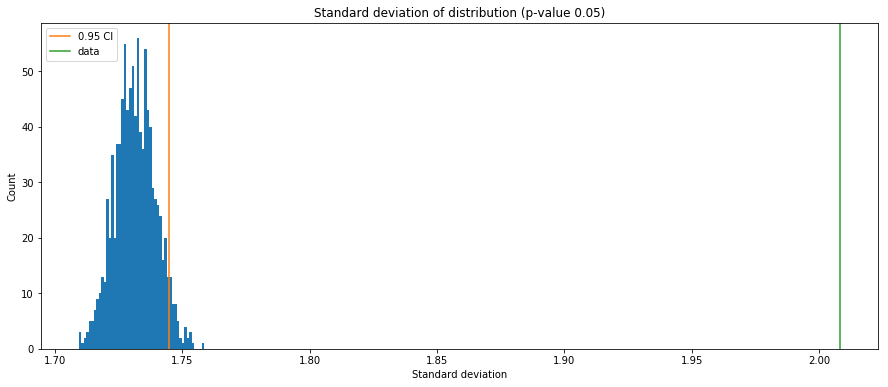

In [26]:
stds = np.std(np.random.uniform(0, 6, (1000, 10000)), axis=1)

plt.figure(figsize=(15, 6))
plt.hist(stds, 50)
plt.title('Standard deviation of distribution (p-value 0.05)')
plt.xlabel('Standard deviation')
plt.ylabel('Count')
plt.axvline(np.percentile(stds, 95), c='C1', label='0.95 CI')
plt.axvline(std, c='C2', label='data')
plt.legend()
if savefigs: plt.savefig('figures/0.05 CI of std of weekdays.png')
plt.show()

$H_0$ is rejected with a 0.05 confidence.

### Location plots and clustering

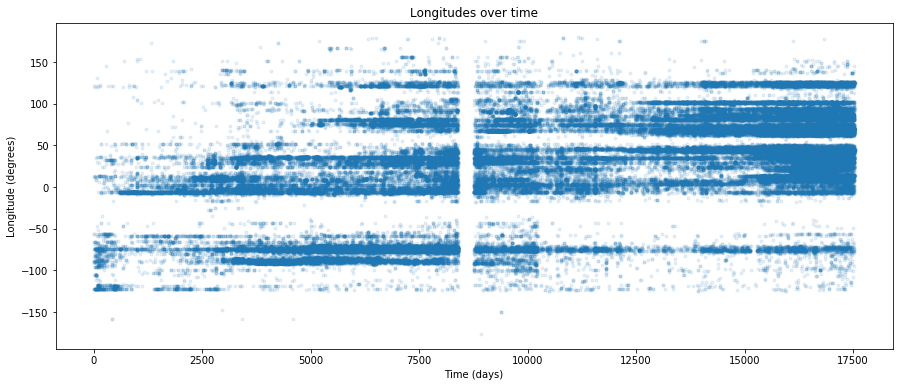

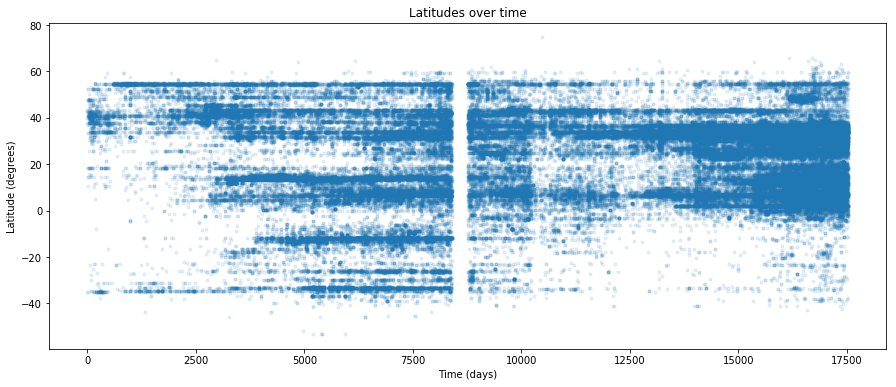

In [27]:
# Mask valid locations on top of valid times.
vloc = dfview(df[vtimes]['longitude'] > -180)
t1 = t[vloc]
df1 = df[vtimes][vloc]

plt.figure(figsize=(15, 6))
plt.scatter(t1, df1['longitude'], marker='.', alpha=0.1)
plt.title('Longitudes over time')
plt.xlabel('Time (days)')
plt.ylabel('Longitude (degrees)')
if savefigs: plt.savefig('figures/Longitudes over time')
plt.show()

plt.figure(figsize=(15, 6))
plt.scatter(t1, df1['latitude'], marker='.', alpha=0.1)
plt.title('Latitudes over time')
plt.xlabel('Time (days)')
plt.ylabel('Latitude (degrees)')
if savefigs: plt.savefig('figures/Latitudes over time')
plt.show()

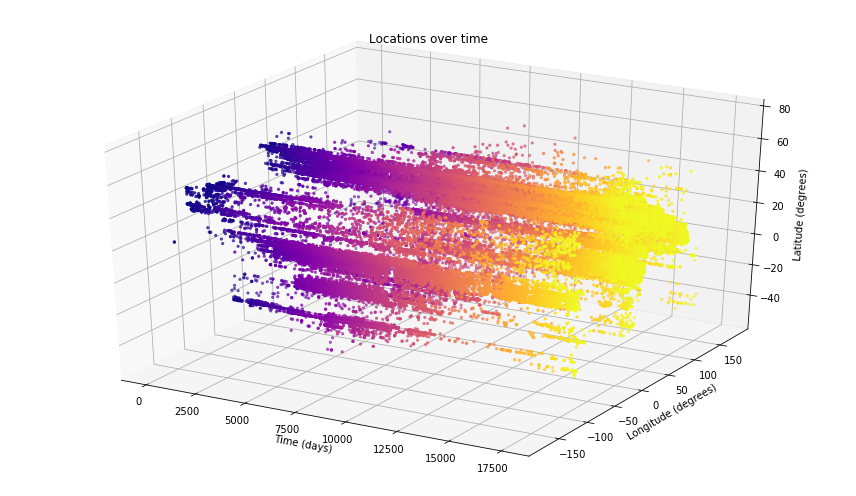

In [28]:
# Plot the locations of attacks over time.
plt.figure(figsize=(12, 7))
ax = plt.axes(projection='3d')
ax.scatter3D(t1, df1['longitude'], df1['latitude'], cmap=plt.cm.plasma, c=t1, marker='.')
ax.set_title('Locations over time')
ax.set_xlabel('Time (days)')
ax.set_ylabel('Longitude (degrees)')
ax.set_zlabel('Latitude (degrees)')
plt.tight_layout() # fixes z axis label getting cut off
if savefigs: plt.savefig('figures/Locations over time')
plt.show()

In [29]:
# Pairwise haversine distance calculation for strided dataset.
stride = 20
df2 = df1[::stride] # convenience alias.
n = len(df2)
d = np.zeros((n, n))

# Calculate pairwise haversine distances
for i in range(1, n // 2 + 1):
    h = haversine(df2['longitude'].values, df2['latitude'].values, np.roll(df2['longitude'].values, i), np.roll(df2['latitude'].values, i))
    np.fill_diagonal(d[i:], h[i:]) # i-th diagonal from center in lower triangle
    np.fill_diagonal(d[-i:], h[:i]) # i-th diagonal from corner in lower triangle
d += d.T

In [30]:
# DBSCAN clustering with neighborhood distance 1
clustering = DBSCAN(eps=1, metric='precomputed').fit(d)

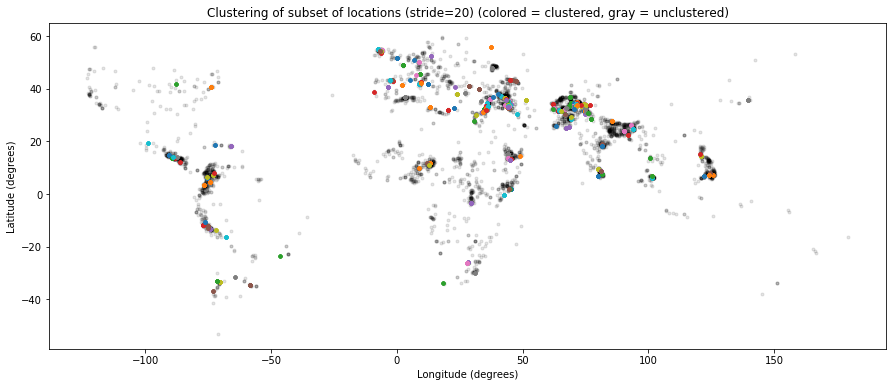

In [31]:
plt.figure(figsize=(15, 6))

# Plot each cluster in cycle color, or gray if unclustered
for i in range(-1, np.max(clustering.labels_) + 1):
    c = 'k' if i == -1 else 'C' + str(i % 10)
    a = 0.1 if i == -1 else 1
    plt.scatter(df2[clustering.labels_ == i]['longitude'], df2[clustering.labels_ == i]['latitude'], marker='.', color=c, alpha=a)
    
plt.title('Clustering of subset of locations (stride=20) (colored = clustered, gray = unclustered)')
plt.xlabel('Longitude (degrees)')
plt.ylabel('Latitude (degrees)')
if savefigs: plt.savefig('figures/Location clustering')
plt.show()

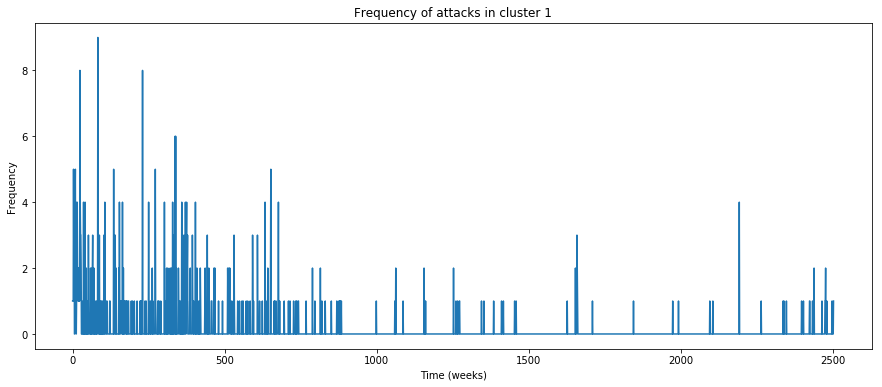

In [32]:
# Obtain cluster mean of arbitrary cluster (1 should be NYC)
cmean_lon = np.mean(df2[clustering.labels_ == 1]['longitude'].values)
cmean_lat = np.mean(df2[clustering.labels_ == 1]['latitude'].values)

n = len(df1)

# Calculate distances from cluster mean.
dist = haversine(np.repeat(cmean_lon, n), np.repeat(cmean_lat, n), df1['longitude'], df1['latitude'])
maxdist = 10

plt.figure(figsize=(15, 6))
# Plot times of attacks near cluster mean in weeks.
data, _ = np.histogram(t1[dist < maxdist].values, np.max(t) // 7) 

plt.plot(data)
plt.title('Frequency of attacks in cluster 1')
plt.xlabel('Time (weeks)')
plt.ylabel('Frequency')
if savefigs: plt.savefig('figures/Cluster 1 attack frequency')
plt.show()